# Load Data

In [3]:
import pandas as pd

import warnings
warnings.simplefilter("ignore", UserWarning)
from tqdm import tqdm

import os
import gpxpy 
from fit2gpx import Converter, StravaConverter
import fitdecode


In [111]:
data_path = "data/activities.csv"

df_activities = pd.read_csv(data_path)
df_activities.head()

,ID de l'activité,Date de l'activité,Nom de l'activité,Type d'activité,Description de l'activité,Temps écoulé,Distance,Fréquence cardiaque maximum,Mesure d'effort,Déplacement-transport,...,"<span class=""translation_missing"" title=""translation missing: fr-FR.lib.export.portability_exporter.activities.horton_values.total_grit"">Total Grit</span>","<span class=""translation_missing"" title=""translation missing: fr-FR.lib.export.portability_exporter.activities.horton_values.avg_flow"">Avg Flow</span>","<span class=""translation_missing"" title=""translation missing: fr-FR.lib.export.portability_exporter.activities.horton_values.flagged"">Flagged</span>","<span class=""translation_missing"" title=""translation missing: fr-FR.lib.export.portability_exporter.activities.horton_values.avg_elapsed_speed"">Avg Elapsed Speed</span>","<span class=""translation_missing"" title=""translation missing: fr-FR.lib.export.portability_exporter.activities.horton_values.dirt_distance"">Dirt Distance</span>","<span class=""translation_missing"" title=""translation missing: fr-FR.lib.export.portability_exporter.activities.horton_values.newly_explored_distance"">Newly Explored Distance</span>","<span class=""translation_missing"" title=""translation missing: fr-FR.lib.export.portability_exporter.activities.horton_values.newly_explored_dirt_distance"">Newly Explored Dirt Distance</span>","<span class=""translation_missing"" title=""translation missing: fr-FR.lib.export.portability_exporter.activities.horton_values.sport_type"">Sport Type</span>","<span class=""translation_missing"" title=""translation missing: fr-FR.lib.export.portability_exporter.activities.horton_values.total_steps"">Total Steps</span>",Support
0,102155537,27 déc. 2013 à 12:35:59,Enfin la reprise !,Vélo,NaN,3096,"24,67",NaN,NaN,False,...,NaN,NaN,NaN,NaN,0.000000,NaN,NaN,NaN,NaN,NaN
1,102581269,29 déc. 2013 à 12:06:22,"I2/3, pointes I4",Vélo,NaN,5537,"40,45",NaN,NaN,False,...,NaN,NaN,NaN,NaN,310.399994,NaN,NaN,NaN,NaN,NaN
2,103191732,1 janv. 2014 à 11:22:39,SG / I2 en souplesse,Vélo,NaN,8710,"64,73",NaN,NaN,False,...,NaN,NaN,NaN,NaN,212.899994,NaN,NaN,NaN,NaN,NaN
3,104215700,5 janv. 2014 à 12:17:58,SG à I3 - avec Nico et Pascal,Vélo,NaN,11846,"82,68",NaN,NaN,False,...,NaN,NaN,NaN,NaN,0.000000,NaN,NaN,NaN,NaN,NaN
4,106526947,15 janv. 2014 à 12:32:41,Sortie club - Fartlek,Vélo,NaN,9389,"62,86",NaN,NaN,False,...,NaN,NaN,NaN,NaN,0.000000,NaN,NaN,NaN,NaN,NaN


In [3]:
df_activities.columns

Index(['ID de l'activité', 'Date de l'activité', 'Nom de l'activité',
       'Type d'activité', 'Description de l'activité', 'Temps écoulé',
       'Distance', 'Fréquence cardiaque maximum', 'Mesure d'effort',
       'Déplacement-transport', 'Note privée sur les activités',
       'Équipement utilisé pour l'activité', 'Nom du fichier',
       'Poids de l'athlète', 'Poids du vélo', 'Temps écoulé.1',
       'Durée de déplacement', 'Distance.1', 'Vitesse max.', 'Vitesse moyenne',
       'Dénivelé positif', 'Dénivelé négatif', 'Altitude min.',
       'Altitude max.', 'Pente max.', 'Pente moyenne',
       'Pente positive moyenne', 'Pente négative moyenne', 'Cadence max.',
       'Cadence moyenne', 'Fréquence cardiaque maximum.1',
       'Fréquence cardiaque moyenne', 'Puissance max.', 'Puissance moyenne',
       'Calories', 'Température max.', 'Température moyenne',
       'Mesure d'effort.1', 'Effort total', 'Nombre de sorties course à pied',
       'Temps de montée', 'Temps de descente', 

In [4]:
# Total lines & total number of columns
df_activities.shape

(2393, 87)

In [5]:
# Unique Activity Types
df_activities["Type d'activité"].unique()

array(['Vélo', 'Marche', 'Entraînement', 'Entraînement aux poids',
       'Course à pied', 'Vélo virtuel'], dtype=object)

In [6]:
# Unique Activity Types
cap = df_activities[df_activities["Type d'activité"]=="Course à pied"]
cap.head()

,ID de l'activité,Date de l'activité,Nom de l'activité,Type d'activité,Description de l'activité,Temps écoulé,Distance,Fréquence cardiaque maximum,Mesure d'effort,Déplacement-transport,...,"<span class=""translation_missing"" title=""translation missing: fr-FR.lib.export.portability_exporter.activities.horton_values.total_grit"">Total Grit</span>","<span class=""translation_missing"" title=""translation missing: fr-FR.lib.export.portability_exporter.activities.horton_values.avg_flow"">Avg Flow</span>","<span class=""translation_missing"" title=""translation missing: fr-FR.lib.export.portability_exporter.activities.horton_values.flagged"">Flagged</span>","<span class=""translation_missing"" title=""translation missing: fr-FR.lib.export.portability_exporter.activities.horton_values.avg_elapsed_speed"">Avg Elapsed Speed</span>","<span class=""translation_missing"" title=""translation missing: fr-FR.lib.export.portability_exporter.activities.horton_values.dirt_distance"">Dirt Distance</span>","<span class=""translation_missing"" title=""translation missing: fr-FR.lib.export.portability_exporter.activities.horton_values.newly_explored_distance"">Newly Explored Distance</span>","<span class=""translation_missing"" title=""translation missing: fr-FR.lib.export.portability_exporter.activities.horton_values.newly_explored_dirt_distance"">Newly Explored Dirt Distance</span>","<span class=""translation_missing"" title=""translation missing: fr-FR.lib.export.portability_exporter.activities.horton_values.sport_type"">Sport Type</span>","<span class=""translation_missing"" title=""translation missing: fr-FR.lib.export.portability_exporter.activities.horton_values.total_steps"">Total Steps</span>",Support
144,237996431,7 janv. 2015 à 16:12:42,07/01/15 - CAP,Course à pied,Test pour voir si le genou encaisse.,2159,"5,70",NaN,NaN,False,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
148,239682073,11 janv. 2015 à 13:55:48,11/01/15 - CAP,Course à pied,Avec Nico,2372,"6,96",NaN,NaN,False,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
152,240989934,14 janv. 2015 à 16:00:37,14/01/15 - CAP,Course à pied,Moins facile cette fois,2408,"7,81",NaN,NaN,False,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
162,269658736,17 mars 2015 à 15:45:25,CAP - Petite reprise tranquillou,Course à pied,"Après un hiver partagé entre les travaux, une ...",1227,"3,37",NaN,NaN,False,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
163,271514727,21 mars 2015 à 07:52:35,Autour de Champ accompagné du fiston en vélo,Course à pied,Ça va mieux :-),1937,"5,73",NaN,NaN,False,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [7]:
df_activities.isna().sum()

ID de l'activité                                                                                                                                                                                     0
Date de l'activité                                                                                                                                                                                   0
Nom de l'activité                                                                                                                                                                                    0
Type d'activité                                                                                                                                                                                      0
Description de l'activité                                                                                                                                                                         1865
     

In [9]:
# Drop columns with only NaN values
df_activities = df_activities.dropna(axis=1, how='all')
df_activities

,ID de l'activité,Date de l'activité,Nom de l'activité,Type d'activité,Description de l'activité,Temps écoulé,Distance,Fréquence cardiaque maximum,Mesure d'effort,Déplacement-transport,...,Probabilité de précipitations,Type de précipitations,Couverture nuageuse,Visibilité selon les prévisions météo,Indice UV,Ozone selon les prévisions météo,"<span class=""translation_missing"" title=""translation missing: fr-FR.lib.export.portability_exporter.activities.horton_values.flagged"">Flagged</span>","<span class=""translation_missing"" title=""translation missing: fr-FR.lib.export.portability_exporter.activities.horton_values.avg_elapsed_speed"">Avg Elapsed Speed</span>","<span class=""translation_missing"" title=""translation missing: fr-FR.lib.export.portability_exporter.activities.horton_values.dirt_distance"">Dirt Distance</span>",Support
0,102155537,27 déc. 2013 à 12:35:59,Enfin la reprise !,Vélo,NaN,3096,"24,67",NaN,NaN,False,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.000000,NaN
1,102581269,29 déc. 2013 à 12:06:22,"I2/3, pointes I4",Vélo,NaN,5537,"40,45",NaN,NaN,False,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,310.399994,NaN
2,103191732,1 janv. 2014 à 11:22:39,SG / I2 en souplesse,Vélo,NaN,8710,"64,73",NaN,NaN,False,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,212.899994,NaN
3,104215700,5 janv. 2014 à 12:17:58,SG à I3 - avec Nico et Pascal,Vélo,NaN,11846,"82,68",NaN,NaN,False,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.000000,NaN
4,106526947,15 janv. 2014 à 12:32:41,Sortie club - Fartlek,Vélo,NaN,9389,"62,86",NaN,NaN,False,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.000000,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2388,8564569757,15 févr. 2023 à 09:29:58,BHV #5 - Chrono par équipe,Vélo,4èmes 🍫,1574,"18,11",174.0,46.0,False,...,0.0,NaN,0.01,16093.0,1.0,296.700012,0.0,11.506023,0.000000,media/9cb958f5-b459-481a-9547-ead66693b222.jpg
2389,8571280241,16 févr. 2023 à 10:59:50,BHV #6,Vélo,Gruppetto.\n3ème jour consécutif -> cuit cuit 🐥,13124,"139,03",183.0,272.0,False,...,0.0,NaN,0.84,16093.0,2.0,304.000000,0.0,10.593569,0.000000,media/fcdb9e05-93d5-4536-a4ee-79eaaba1e9b4.jpg
2390,8571280704,16 févr. 2023 à 10:31:27,Route,Vélo,NaN,1087,"4,04",129.0,1.0,False,...,0.0,NaN,0.84,16093.0,2.0,304.000000,0.0,3.716357,0.000000,NaN
2391,8575677445,17 févr. 2023 à 09:39:32,Stage J7,Vélo,NaN,9544,"73,94",153.0,26.0,False,...,0.0,NaN,0.31,16093.0,1.0,306.899994,0.0,7.747588,0.000000,NaN


In [10]:
# drop unecessary columns 
df_activities = df_activities.drop(columns=["Déplacement-transport", "Utiliser l'Effort ressenti", "À partir du téléchargement"])

In [11]:
#filter to keep biking (virtual and ride) only

ridetypes = ["Vélo", "Vélo virtuel"]
df_bike = df_activities[df_activities["Type d\'activité"].isin(ridetypes)]
df_bike

,ID de l'activité,Date de l'activité,Nom de l'activité,Type d'activité,Description de l'activité,Temps écoulé,Distance,Fréquence cardiaque maximum,Mesure d'effort,Équipement utilisé pour l'activité,...,Probabilité de précipitations,Type de précipitations,Couverture nuageuse,Visibilité selon les prévisions météo,Indice UV,Ozone selon les prévisions météo,"<span class=""translation_missing"" title=""translation missing: fr-FR.lib.export.portability_exporter.activities.horton_values.flagged"">Flagged</span>","<span class=""translation_missing"" title=""translation missing: fr-FR.lib.export.portability_exporter.activities.horton_values.avg_elapsed_speed"">Avg Elapsed Speed</span>","<span class=""translation_missing"" title=""translation missing: fr-FR.lib.export.portability_exporter.activities.horton_values.dirt_distance"">Dirt Distance</span>",Support
0,102155537,27 déc. 2013 à 12:35:59,Enfin la reprise !,Vélo,NaN,3096,"24,67",NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.000000,NaN
1,102581269,29 déc. 2013 à 12:06:22,"I2/3, pointes I4",Vélo,NaN,5537,"40,45",NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,310.399994,NaN
2,103191732,1 janv. 2014 à 11:22:39,SG / I2 en souplesse,Vélo,NaN,8710,"64,73",NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,212.899994,NaN
3,104215700,5 janv. 2014 à 12:17:58,SG à I3 - avec Nico et Pascal,Vélo,NaN,11846,"82,68",NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.000000,NaN
4,106526947,15 janv. 2014 à 12:32:41,Sortie club - Fartlek,Vélo,NaN,9389,"62,86",NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.000000,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2388,8564569757,15 févr. 2023 à 09:29:58,BHV #5 - Chrono par équipe,Vélo,4èmes 🍫,1574,"18,11",174.0,46.0,Canyon CF SL 20,...,0.0,NaN,0.01,16093.0,1.0,296.700012,0.0,11.506023,0.000000,media/9cb958f5-b459-481a-9547-ead66693b222.jpg
2389,8571280241,16 févr. 2023 à 10:59:50,BHV #6,Vélo,Gruppetto.\n3ème jour consécutif -> cuit cuit 🐥,13124,"139,03",183.0,272.0,Canyon CF SL 20,...,0.0,NaN,0.84,16093.0,2.0,304.000000,0.0,10.593569,0.000000,media/fcdb9e05-93d5-4536-a4ee-79eaaba1e9b4.jpg
2390,8571280704,16 févr. 2023 à 10:31:27,Route,Vélo,NaN,1087,"4,04",129.0,1.0,Canyon CF SL 20,...,0.0,NaN,0.84,16093.0,2.0,304.000000,0.0,3.716357,0.000000,NaN
2391,8575677445,17 févr. 2023 à 09:39:32,Stage J7,Vélo,NaN,9544,"73,94",153.0,26.0,Canyon CF SL 20,...,0.0,NaN,0.31,16093.0,1.0,306.899994,0.0,7.747588,0.000000,NaN


## Export GPX files

### Unizip data

In [21]:
DIR_STRAVA = 'data/'

# Step 1: Create StravaConverter object
# - Note: the dir_in must be the path to the central unzipped Strava bulk export folder
# - Note: You can specify the dir_out if you wish. By default it is set to 'activities_gpx', which will be created in main Strava folder specified.

strava_conv = StravaConverter(
    dir_in=DIR_STRAVA
)

# Step 2: Unzip the zipped files
strava_conv.unzip_activities()

### Create DF
Iterate through the activities files and read each file into a pandas DF using the appropriate library (gpxpy for GPX files, and fitdecode for FIT files). Then, merge the data from the activity DataFrame with the data from the file DataFrame using the activity ID as the key.

In [71]:
def read_fit_gpx_files(directory):
    """
    Read .fit and .gpx files from a directory and combine them into a single Pandas dataframe.

    Parameters:
    -----------
    directory : str
        Path to the directory containing the .fit and .gpx files.

    Returns:
    --------
    df : pandas.DataFrame
        Dataframe containing all the records from .fit and .gpx files in the directory,
        with an additional 'activity_id' column based on the filename.
    """
    # Create an empty DataFrame to store the data
    combined_df = pd.DataFrame()

    # loop over all files in the directory
    for file in os.listdir(directory):
        # check if the file is a .fit or .gpx file
        if file.endswith('.fit'):
            # read the .fit file using fitdecode
            filepath = os.path.join(directory, file)
            with fitdecode.FitReader(filepath) as fit:
                data = []
                for frame in fit:
                    if isinstance(frame, fitdecode.FitDataMessage):
                        if frame.name == 'record':
                            record_data = {}
                            for field in frame:
                                record_data[field.name.lower()] = field.value
                            data.append(record_data)
            # Convert the data to a DataFrame and add the "activity_id" column
            df = pd.DataFrame(data)
            activity_id = os.path.splitext(file)[0]
            df.insert(0, 'activity_id', activity_id)
            # Append the DataFrame to the combined DataFrame
            combined_df = pd.concat([combined_df, df], ignore_index=True)

        elif file.endswith('.gpx'):
            # read the .gpx file using gpxpy library
            filepath = os.path.join(directory, file)
            with open(filepath, 'r') as gpx_file:
                gpx = gpxpy.parse(gpx_file)
                data = [{'latitude': p.latitude,
                         'longitude': p.longitude,
                         'elevation': p.elevation,
                         'time': p.time} for p in gpx.tracks[0].segments[0].points]
            df = pd.DataFrame(data)
            # add an 'activity_id' column based on the filename
            activity_id = os.path.splitext(file)[0]
            df.insert(0, 'activity_id', activity_id)
            # Append the DataFrame to the combined DataFrame
            combined_df = pd.concat([combined_df, df], ignore_index=True)
    
    return df

### GPX Files

In [30]:
import os
import pandas as pd
import fitdecode
import gpxpy
from tqdm import tqdm

In [27]:
def read_gpx_files(directory):
    """
    Read .gpx files from a directory and combine them into a single Pandas dataframe.

    Parameters:
    -----------
    directory : str
        Path to the directory containing the .gpx files.

    Returns:
    --------
    df : pandas.DataFrame
        Dataframe containing all the records from .gpx files in the directory,
        with an additional 'activity_id' column based on the filename.
    """
    # Create an empty DataFrame to store the data
    combined_df = pd.DataFrame()

    # loop over all files in the directory
    for file in tqdm(os.listdir(directory)):
        if file.endswith('.gpx'):
            # read the .gpx file using gpxpy library
            filepath = os.path.join(directory, file)
            with open(filepath, 'r') as gpx_file:
                gpx = gpxpy.parse(gpx_file)
                data = [{'latitude': p.latitude,
                         'longitude': p.longitude,
                         'elevation': p.elevation,
                         'time': p.time} for p in gpx.tracks[0].segments[0].points]
            df = pd.DataFrame(data)
            # add an 'activity_id' column based on the filename
            activity_id = os.path.splitext(file)[0]
            df.insert(0, 'activity_id', activity_id)
            # Append the DataFrame to the combined DataFrame
            combined_df = pd.concat([combined_df, df], ignore_index=True)

    return combined_df


In [29]:

# read all .gpx files in the 'activities' folder
directory = 'data/activities/'
df_gpx = read_gpx_files(directory)

# save the combined data to a csv file
csv_file = 'data/gpx_data.csv'
df_gpx.to_csv(csv_file, index=False)

# print the number of rows in the dataframe and the saved csv file
print(f"Number of rows in dataframe: {len(df_gpx)}")
print(f"CSV file saved to: {csv_file}")

100%|██████████| 2331/2331 [00:44<00:00, 52.43it/s] 


Number of rows in dataframe: 1223196
CSV file saved to: data/gpx_data.csv


### Save as separate .CSV

In [19]:
def read_gpx_files_indiv(directory):
    """
    Read .gpx files from a directory and save them as .csv files in the same directory.

    Parameters:
    -----------
    directory : str
        Path to the directory containing the .gpx files.

    Returns:
    --------
    None
    """
    # loop over all files in the directory
    for file in tqdm(os.listdir(directory)):
        if file.endswith('.gpx'):
            # read the .gpx file using gpxpy library
            filepath = os.path.join(directory, file)
            with open(filepath, 'r') as gpx_file:
                gpx = gpxpy.parse(gpx_file)
                data = [{'latitude': p.latitude,
                         'longitude': p.longitude,
                         'elevation': p.elevation,
                         'time': p.time} for p in gpx.tracks[0].segments[0].points]
            df = pd.DataFrame(data)
            # Save the DataFrame as a CSV file
            csv_file = os.path.splitext(file)[0] + '.csv'
            csv_path = os.path.join(directory, csv_file)
            df.to_csv(csv_path, index=False)

    print('Done')


In [21]:
directory = 'data/activities/'
read_gpx_files_indiv(directory)

100%|██████████| 4365/4365 [01:09<00:00, 62.98it/s] 

Done


## Fit Files

In [7]:
from garmin_fit_sdk import Decoder, Stream
from garmin_fit_sdk import Decoder, Stream
from tqdm import tqdm
import fitparse

In [ ]:
stream = Stream.from_file("data/activities/9212811005.fit")
decoder = Decoder(stream)
messages, errors = decoder.read()

print(errors)
print(messages)

In [1]:
# Load the FIT file
fitfile = fitparse.FitFile("data/activities/9212811005.fit")

# Iterate over all messages of type "record"
# (other types include "device_info", "file_creator", "event", etc)
for record in fitfile.get_messages("record"):

    # Records can contain multiple pieces of data (ex: timestamp, latitude, longitude, etc)
    for data in record:

        # Print the name and value of the data (and the units if it has any)
        if data.units:
            print(" * {}: {} ({})".format(data.name, data.value, data.units))
        else:
            print(" * {}: {}".format(data.name, data.value))

data

 * heart_rate: 57 (bpm)
 * timestamp: 2023-02-18 09:35:13
 * battery_soc: 100.0 (percent)
 * cadence: 0 (rpm)
 * calories: 0 (kcal)
 * distance: 0.0 (m)
 * enhanced_speed: 1.41 (m/s)
 * gps_accuracy: 3 (m)
 * heart_rate: 57 (bpm)
 * position_lat: 521379567 (semicircles)
 * position_long: 67677508 (semicircles)
 * power: 0 (watts)
 * speed: 1.41 (m/s)
 * timestamp: 2023-02-18 09:35:14
 * cadence: 0 (rpm)
 * calories: 0 (kcal)
 * distance: 1.59 (m)
 * enhanced_speed: 1.669 (m/s)
 * gps_accuracy: 3 (m)
 * heart_rate: 57 (bpm)
 * position_lat: 521379722 (semicircles)
 * position_long: 67677350 (semicircles)
 * power: 0 (watts)
 * speed: 1.669 (m/s)
 * timestamp: 2023-02-18 09:35:15
 * cadence: 0 (rpm)
 * calories: 0 (kcal)
 * distance: 3.5 (m)
 * enhanced_speed: 1.535 (m/s)
 * gps_accuracy: 3 (m)
 * heart_rate: 59 (bpm)
 * position_lat: 521379858 (semicircles)
 * position_long: 67677193 (semicircles)
 * power: 0 (watts)
 * speed: 1.535 (m/s)
 * timestamp: 2023-02-18 09:35:16
 * cadence: 7 

<FieldData: timestamp: 2023-02-18 13:53:02, def num: 253, type: date_time (uint32), raw value: 1045662782>

In [17]:
def read_fit_files(directory):
    """
    Read .fit files from a directory and save them as .csv files in the same directory. Ignore the files raisin erros.

    Parameters:
    -----------
    directory : str
        Path to the directory containing the .fit files.

    Returns:
    --------
    None
    """
    # loop over all files in the directory
    for i, file in tqdm(enumerate(os.listdir(directory))):
        # check if the file is a .fit file
        if file.endswith('.fit'):
            # check if a corresponding CSV file exists
            csv_file = os.path.splitext(file)[0] + '.csv'
            if os.path.exists(os.path.join(directory, csv_file)):
                continue
            
            # read the .fit file using fitdecode
            filepath = os.path.join(directory, file)
            try:
                with fitdecode.FitReader(filepath) as fit:
                    data = []
                    for frame in fit:
                        if isinstance(frame, fitdecode.FitDataMessage):
                            if frame.name == 'record':
                                record_data = {}
                                for field in frame:
                                    try:
                                        record_data[field.name.lower()] = field.value
                                    except TypeError:
                                        pass
                                data.append(record_data)
                # Convert the data to a DataFrame
                df = pd.DataFrame(data)

                # Save the DataFrame as a CSV file
                csv_path = os.path.join(directory, csv_file)
                df.to_csv(csv_path, index=False)
                
            except TypeError:
                print(f"{file} has an issue with TypeError, moving on to the next file")
                continue
            
            except fitdecode.exceptions.FitHeaderError:
                print(f"{file} has an issue with FitHeaderError, moving on to the next file")
                continue

    print('Done')


In [18]:
directory = 'data/activities/'

#first 300 files
df_fit = read_fit_files(directory)

4312it [00:00, 12521.74it/s]

8952687437.fit has an issue with TypeError, moving on to the next file
8965845812.fit has an issue with TypeError, moving on to the next file
8991794536.fit has an issue with TypeError, moving on to the next file
9001137193.fit has an issue with TypeError, moving on to the next file
9004720055.fit has an issue with TypeError, moving on to the next file
960009327.fit has an issue with FitHeaderError, moving on to the next file


4353it [00:23, 186.59it/s]  

Done


## TCX Files

In [ ]:
#remove the trailing white spaces thatt cause issues

def remove_first_10_chars(file_path):
    with open(file_path, 'r') as f:
        content = f.read()
    with open(file_path, 'w') as f:
        f.write(content[10:])

directory_path = 'data/activities/'

for filename in os.listdir(directory_path):
    if filename.endswith('.tcx'):
        file_path = os.path.join(directory_path, filename)
        remove_first_10_chars(file_path)


In [126]:
tcx_reader = TCXReader()
file_location = "data/activities/173574200.tcx"

data = tcx_reader.read(file_location)

df = pd.DataFrame({
    "time": [tp.time for tp in data.trackpoints],
    "latitude": [tp.latitude for tp in data.trackpoints],
    "longitude": [tp.longitude for tp in data.trackpoints],
    "altitude_meters": [tp.elevation for tp in data.trackpoints],
    "distance_meters": [tp.distance for tp in data.trackpoints],
    "heart_rate_bpm": [tp.hr_value for tp in data.trackpoints],
    "cadence_rpm": [tp.cadence for tp in data.trackpoints],
    "speed_mps": [tp.tpx_ext.get('Speed', None) for tp in data.trackpoints]
})

print(df.head())


                 time   latitude  longitude  altitude_meters  distance_meters  \
0 2014-06-27 14:36:06  45.083370   5.728838            232.0              0.0   
1 2014-06-27 14:36:10  45.083395   5.728901            232.0              5.0   
2 2014-06-27 14:36:14  45.083465   5.728976            232.0             15.0   
3 2014-06-27 14:36:18  45.083601   5.729021            232.0             30.0   
4 2014-06-27 14:36:22  45.083771   5.728990            232.0             50.0   

   heart_rate_bpm  cadence_rpm  speed_mps  
0              74         25.0        2.9  
1              75         25.0        3.6  
2              84         73.0        5.0  
3              91         80.0        5.1  
4              92         84.0        5.2  


In [110]:
data.duration

3928.0

In [106]:
df["altitude_meters"].max()

431.0

In [139]:
def convert_tcx_to_csv_with_activity_id(tcx_directory, activities_file, csv_directory):
    """
    Reads TCX files from a given directory, extracts data and appends the activity id, and saves the data as CSV file
    for each activity in the directory.
    
    :param tcx_directory: Directory containing TCX files
    :param activities_file: CSV file containing activity data
    :param csv_directory: Directory to save CSV files
    """
    
    # Load activities file
    df_activities = pd.read_csv(activities_file)
    
    # Iterate over TCX files in directory
    for file_name in os.listdir(tcx_directory):
        if file_name.endswith(".tcx"):
            # Create file path
            file_location = os.path.join(tcx_directory, file_name)
            
            # Read data from TCX file
            tcx_reader = TCXReader()
            data = tcx_reader.read(file_location)

            # Extract data to DataFrame
            df = pd.DataFrame({
                "time": [tp.time for tp in data.trackpoints],
                "latitude": [tp.latitude for tp in data.trackpoints],
                "longitude": [tp.longitude for tp in data.trackpoints],
                "altitude_meters": [tp.elevation for tp in data.trackpoints],
                "distance_meters": [tp.distance for tp in data.trackpoints],
                "heart_rate_bpm": [tp.hr_value for tp in data.trackpoints],
                "cadence_rpm": [tp.cadence for tp in data.trackpoints],
                "speed_mps": [tp.tpx_ext.get('Speed', None) for tp in data.trackpoints]
            })

            # Get activity id
            filename = file_name.replace(".gz", "")
            df_activities_na = df_activities.dropna(subset=['Nom du fichier'])
            match = df_activities_na.loc[df_activities_na["Nom du fichier"].str.contains(filename)]
            activity_id = match["ID de l'activité"].values[0]

            # Append activity id to DataFrame
            df["activity_id"] = activity_id

            # Save DataFrame to CSV file
            csv_filename = file_name.replace(".tcx", ".csv")
            csv_location = os.path.join(csv_directory, csv_filename)
            df.to_csv(csv_location, index=False)


In [141]:
tcx_directory = "data/activities/"
activities_file = "data/activities.csv"
csv_directory = "data/activities/"
convert_tcx_to_csv_with_activity_id(tcx_directory, activities_file, csv_directory)


# TEST FUNCTIONS

In [2]:
from features.create_csv import *

import pandas as pd
import os
from tqdm import tqdm

import gpxpy 
from fit2gpx import Converter, StravaConverter
import fitdecode

from garmin_fit_sdk import Decoder, Stream
from garmin_fit_sdk import Decoder, Stream
import fitparse

from tcxreader.tcxreader import TCXReader, TCXTrackPoint

In [3]:
## Paths
DIR_STRAVA = 'data/'
directory = "data/activities/"
activities_file = "data/activities.csv"
csv_directory = "data/activities_csv/"

#### Unzip Data

In [8]:
unzip_strava_export(DIR_STRAVA)

#### Handle .gpx files

In [4]:
read_gpx_files_indiv(directory)

100%|██████████| 2332/2332 [01:44<00:00, 22.41it/s] 

Done


#### Handle .fit files

In [4]:
read_fit_files(directory)

2245it [38:46,  1.53s/it]

8952687437.fit has an issue with TypeError, moving on to the next file


2248it [38:53,  1.93s/it]

8965845812.fit has an issue with TypeError, moving on to the next file


2253it [39:01,  2.01s/it]

8991794536.fit has an issue with TypeError, moving on to the next file


2257it [39:05,  1.45s/it]

9001137193.fit has an issue with TypeError, moving on to the next file
9004720055.fit has an issue with TypeError, moving on to the next file


2318it [41:10,  1.94s/it]

960009327.fit has an issue with FitHeaderError, moving on to the next file


2332it [41:38,  1.07s/it]

Done


#### Handle .tcx files

In [9]:
remove_first_10_chars_from_tcx_files(directory)

In [10]:
convert_tcx_to_csv_with_activity_id(directory, activities_file, csv_directory)

# Visualization

In [13]:
!conda install -c conda-forge ipyleaflet

'conda' is not recognized as an internal or external command,
operable program or batch file.


In [15]:
from benedict import benedict as bdict

# data-source can be an url, a filepath or data-string (as in this example)
data_source = "data/activities/178130955.gpx"
xmldata = bdict.from_xml(data_source)

In [19]:
trk_list = xmldata['gpx.trk.trkseg.trkpt']
trk_list

[{'@lat': '45.0833230',
  '@lon': '5.7288540',
  'ele': '269.9',
  'time': '2014-08-10T05:57:00Z'},
 {'@lat': '45.0833060',
  '@lon': '5.7289420',
  'ele': '269.9',
  'time': '2014-08-10T05:57:06Z'},
 {'@lat': '45.0832700',
  '@lon': '5.7289640',
  'ele': '269.8',
  'time': '2014-08-10T05:57:09Z'},
 {'@lat': '45.0832330',
  '@lon': '5.7289860',
  'ele': '269.8',
  'time': '2014-08-10T05:57:58Z'},
 {'@lat': '45.0831960',
  '@lon': '5.7290080',
  'ele': '269.7',
  'time': '2014-08-10T05:57:59Z'},
 {'@lat': '45.0831260',
  '@lon': '5.7290580',
  'ele': '269.5',
  'time': '2014-08-10T05:58:00Z'},
 {'@lat': '45.0830390',
  '@lon': '5.7291020',
  'ele': '269.3',
  'time': '2014-08-10T05:58:01Z'},
 {'@lat': '45.0829950',
  '@lon': '5.7291230',
  'ele': '269.2',
  'time': '2014-08-10T05:58:02Z'},
 {'@lat': '45.0829490',
  '@lon': '5.7291390',
  'ele': '269.1',
  'time': '2014-08-10T05:58:03Z'},
 {'@lat': '45.0828960',
  '@lon': '5.7291590',
  'ele': '269.0',
  'time': '2014-08-10T05:58:04Z'},


In [20]:
# Put just Location data into an array
locs=[]
for t in trk_list:
    print(f"lat: %s, lon: %s, time: %s" % (t['@lat'], t['@lon'],t['time']))
    locs.append([float(t['@lat']),float(t['@lon'])])

lat: 45.0833230, lon: 5.7288540, time: 2014-08-10T05:57:00Z
lat: 45.0833060, lon: 5.7289420, time: 2014-08-10T05:57:06Z
lat: 45.0832700, lon: 5.7289640, time: 2014-08-10T05:57:09Z
lat: 45.0832330, lon: 5.7289860, time: 2014-08-10T05:57:58Z
lat: 45.0831960, lon: 5.7290080, time: 2014-08-10T05:57:59Z
lat: 45.0831260, lon: 5.7290580, time: 2014-08-10T05:58:00Z
lat: 45.0830390, lon: 5.7291020, time: 2014-08-10T05:58:01Z
lat: 45.0829950, lon: 5.7291230, time: 2014-08-10T05:58:02Z
lat: 45.0829490, lon: 5.7291390, time: 2014-08-10T05:58:03Z
lat: 45.0828960, lon: 5.7291590, time: 2014-08-10T05:58:04Z
lat: 45.0828260, lon: 5.7291860, time: 2014-08-10T05:58:05Z
lat: 45.0827530, lon: 5.7291880, time: 2014-08-10T05:58:06Z
lat: 45.0827000, lon: 5.7292370, time: 2014-08-10T05:58:07Z
lat: 45.0826440, lon: 5.7292560, time: 2014-08-10T05:58:08Z
lat: 45.0825640, lon: 5.7292730, time: 2014-08-10T05:58:09Z
lat: 45.0825030, lon: 5.7292790, time: 2014-08-10T05:58:10Z
lat: 45.0823970, lon: 5.7292800, time: 2

In [22]:
# Geo Map plot sample
from ipyleaflet import Map, Polyline

line = Polyline(
    locations=locs,
    color="green" ,
    fill=False
)

m = Map(center = ((min(locs)[0]+max(locs)[0])/2, (min(locs)[1]+max(locs)[1])/2), zoom =12)
m.add_layer(line)
m

Map(center=[44.973613, 5.750298], controls=(ZoomControl(options=['position', 'zoom_in_text', 'zoom_in_title', …

In [4]:
from ipyleaflet import Map, Polyline
import pandas as pd
import numpy as np

In [5]:
def plot_ride_map(csv_file):
    """
    Plot a ride map using latitude and longitude data from a CSV file.

    Parameters:
    -----------
    csv_file : str
        Path to the CSV file containing latitude and longitude data.

    Returns:
    --------
    None
    """
    # Read the CSV file into a DataFrame
    df = pd.read_csv(csv_file)

    # Check if the latitude and longitude columns exist in the DataFrame
    if 'latitude' in df.columns and 'longitude' in df.columns:
        # Extract the latitude and longitude data
        latitudes = df['latitude']
        longitudes = df['longitude']
    elif 'position_lat' in df.columns and 'position_long' in df.columns:
        # Extract the position_lat and position_long data and convert to floating-point values
        latitudes = df['position_lat'] / (2**32/360)
        longitudes = df['position_long'] / (2**32/360)
    else:
        raise ValueError("CSV file does not contain latitude and longitude data.")

    # Create a Polyline object from the latitude and longitude data
    locations = list(zip(latitudes, longitudes))
    line = Polyline(
        locations=locations,
        color="green",
        fill=False
    )

    # Create a Map object and add the Polyline to it
    center_lat = np.mean(latitudes)
    center_long = np.mean(longitudes)
    m = Map(center=(center_lat, center_long), zoom=12)
    m.add_layer(line)

    # Display the Map object
    display(m)


In [6]:
plot_ride_map('data/activities_csv/1989387789.csv')

Map(center=[45.06310172667161, 5.721469493943025], controls=(ZoomControl(options=['position', 'zoom_in_text', …

### Power Distribution

In [30]:
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.dates as mdates
import matplotlib.ticker as ticker

def plot_power(csv_path, activities_csv_path):
    """
    Reads a CSV file and plots the power, heart rate, cadence, and speed over time, if the file has the corresponding columns.

    Parameters:
    -----------
    csv_path : str
        Path to the CSV file.

    Returns:
    --------
    None
    """
    # Read the CSV file
    df = pd.read_csv(csv_path)

    # Convert the timestamp column to datetime
    df['timestamp'] = pd.to_datetime(df['timestamp'])

    # Check if the file has a 'power' column
    if 'power' in df.columns:
        # Check if the 'power' column is not completely null
        if not df['power'].isnull().all():
            # Get the activity_id from the CSV file name
            activity_id = activity_id = df["activity_id"][0]

            # Read the activities CSV file
            activities_df = pd.read_csv(activities_csv_path)

            # Find the row with the matching activity_id
            activity_row = activities_df.loc[activities_df["ID de l'activité"] == activity_id]

            # Get the ride date, distance, and duration
            ride_date = activity_row["Date de l'activité"].values[0]
            ride_distance = float(activity_row['Distance'].values[0].replace(',', '.'))
            ride_duration = activity_row['Temps écoulé'].values[0]

            # Convert the duration from seconds to h:min
            ride_duration = int(activity_row['Temps écoulé'].values[0])
            hours, remainder = divmod(ride_duration, 3600)
            minutes, seconds = divmod(remainder, 60)
            ride_duration_str = f"{hours:02d}:{minutes:02d}"

            # Convert speed from m/s to km/h
            df['speed'] = df['speed'] * 3.6

            # Plot the power, heart rate, cadence, and speed over time
            fig, axs = plt.subplots(nrows=4, figsize=(20, 16), sharex=True)
            axs[0].plot(df['timestamp'], df['power'])
            axs[0].set_title(f'Power over Time\n\nDate Activité: {ride_date}\nDistance: {float(ride_distance):.1f} km\nDurée: {ride_duration_str}', fontweight='bold')
            axs[1].plot(df['timestamp'], df['cadence'], color='green')
            axs[1].set_title('Cadence over Time', fontweight='bold')
            axs[2].plot(df['timestamp'], df['speed'], color='orange')
            axs[2].set_title('Speed over Time', fontweight='bold')
            axs[3].plot(df['timestamp'], df['heart_rate'], color='red')
            axs[3].set_title('Heart Rate over Time', fontweight='bold')
            axs[3].set_xlabel('Time')

            # Set y-axis labels
            axs[0].set_ylabel('Power')
            axs[1].set_ylabel('Cadence')
            axs[2].set_ylabel('Speed (km/h)')
            axs[3].set_ylabel('Heart Rate')

            # Set x-axis ticks every 10 minutes
            axs[3].xaxis.set_major_locator(mdates.MinuteLocator(interval=10))
            axs[3].xaxis.set_major_formatter(mdates.DateFormatter('%H:%M'))
           

            # Rotate x-axis tick labels
            plt.setp(axs[3].get_xticklabels(), rotation=45, ha='right')

            plt.show()
        else:
            print('The power column is completely null.')
    else:
        print('File does not have a power column.')


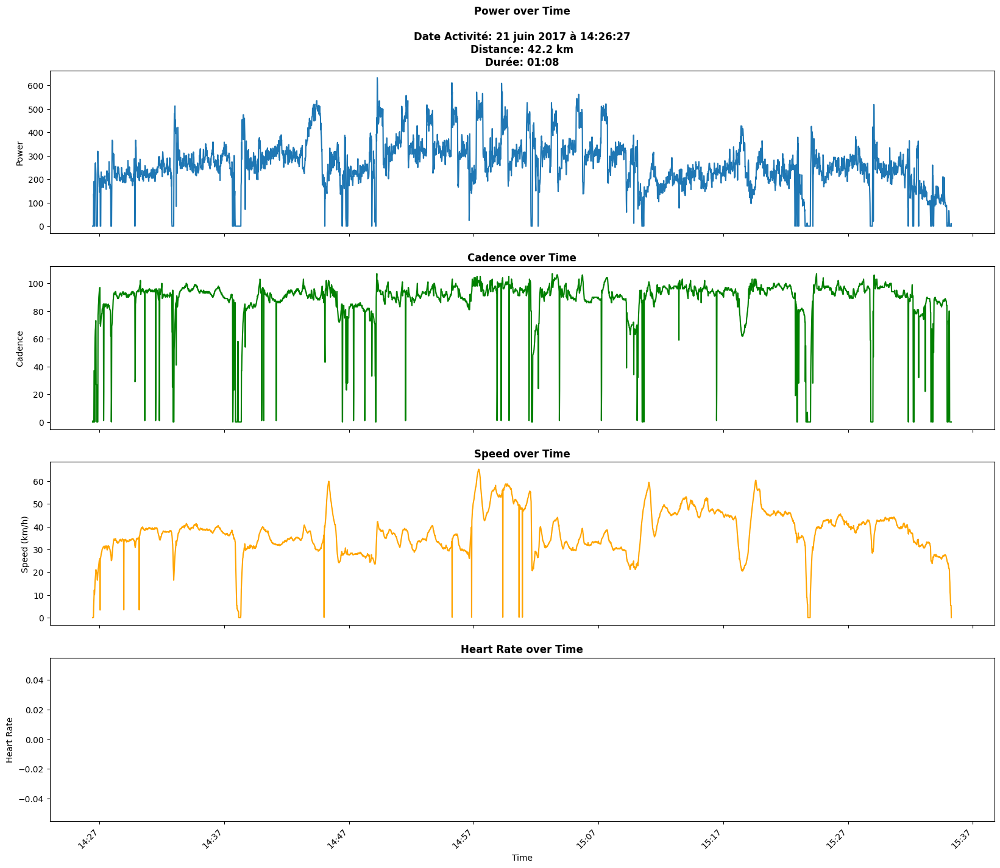

In [31]:
plot_power('data/activities_csv/1150951051.csv', "data/activities.csv")


<AxesSubplot: ylabel='Frequency'>

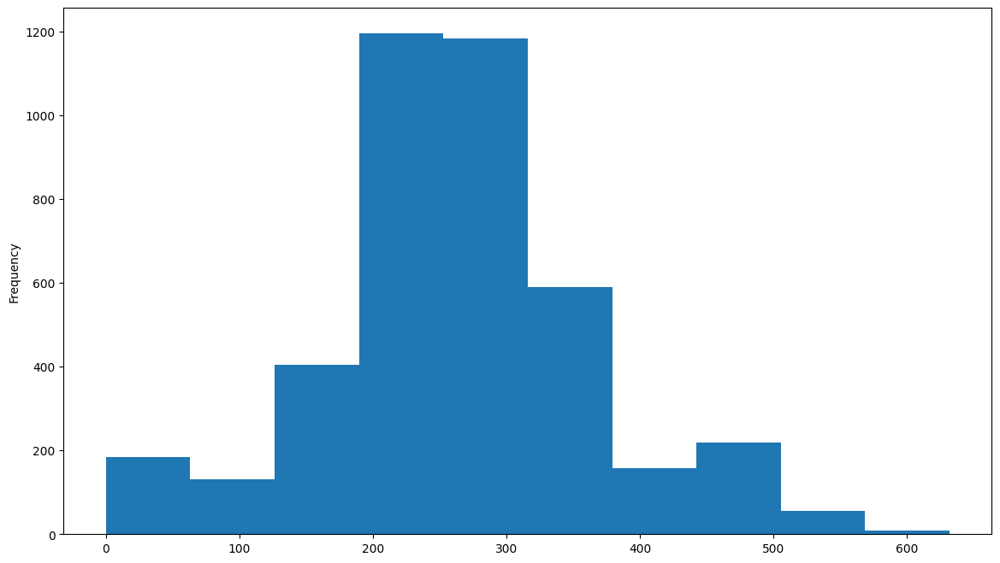

In [56]:
df = pd.read_csv("data/activities_csv/1150951051.csv")
df['power'].plot(kind = 'hist', figsize=(14,8))